# AED :

In [89]:
#importation des bibliothèques
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import re

## fonctions utilisées : implémentation des fonctions  

In [90]:
def nettoyer_texte(text):
    """
    Fonction pour nettoyer les textes en supprimant certains motifs
    """
    text = re.sub(r'https?://\S+|www\.\S+|\[.*?\]\(.*?\)', '', text)    # Supprimes mes URLs
    text = re.sub(r'<.*?>+', '', text)                                  # Supprime les balises
    text = re.sub(r'@\w+', '', text)                                    # Supprime les mentions
    text = re.sub(f'[{re.escape(string.punctuation)}]', '', text)       # Supprime la ponctuation
    text = re.sub(r'\n', '', text)                                      # Supprime les sauts de ligne
    text = re.sub(r'\w*\d\w*', '', text)                                # Supprime les mots contenants des chiffres
    text = re.sub(r'\s+', ' ', text)                                    # Supprime les espaces supplémenraires
    return text.strip()

In [91]:
#description_dataframe
def description_dataframe(data) :

    print("description du dataframe")
    print(f"-colonnes : ", list(data.columns), "\n")

    print(f"- Infos du dataframe :")
    data.info()

    print("\n - Description du dataframe : ")
    print(data.describe())

    print("\n - Entetes (10 premières lignes) du dataframe : ")
    print(data.head(10))


In [92]:
# description du premier chunk
def description(chunk_list) :
    for chunk in chunk_list :
        print("description du premier chunk pour tester")
        print(f"-colonnes : ", list(chunk.columns), "\n")

        print(f"- Infos :")
        chunk.info()

        print("\n - Description : ")
        print(chunk.describe())

        print("\n - Entetes (10 premières lignes) : ")
        print(chunk.head(10))
        break

In [93]:
#valeurs uniques :
def uv (chunks_list) :
    for i, chunk in enumerate(chunks_list):
        print(f"Chunk {i + 1} , sa taille : {chunk.shape[0]} lignes et {chunk.shape[1]} colonnes ")
        for col in chunk.columns:
            unique_count = chunk[col].nunique()
            print(f"{col}: {unique_count} valeurs uniques")
        break


In [94]:
# valuers nulles
def null_v (chunks_list) :
    for i, chunk in enumerate(chunks_list):
        print(f"Chunk {i + 1} , sa taille : {chunk.shape[0]} lignes et {chunk.shape[1]} colonnes ")
        for col in chunk.columns:
            valeur_null = chunk[col].isnull().sum()
            print(f"{col}: {valeur_null} valeurs nulles")
        break

In [95]:
# valuers nulles
def null_v_all_chunks(chunks_list):
    # initialisation d'un dicto pour sommer les NaN par colonne
    total_nulls = {}

    for i, chunk in enumerate(chunks_list):
        # print(f"Chunk {i + 1} : {chunk.shape[0]} lignes, {chunk.shape[1]} colonnes")

        # Somme des NaN dans le chunk
        chunk_nulls = chunk.isnull().sum()

        # Ajout au total
        for col in chunk.columns:
            total_nulls[col] = total_nulls.get(col, 0) + chunk_nulls[col]

    # Affichage des totaux par colonne
    print("\nTotal de valeurs nulles par colonne (tous chunks confondus) :")
    for col, null_count in total_nulls.items():
        print(f"{col} : {null_count} valeurs nulles")


In [96]:
# valuers nulles 
def null_v_df (data) : 
    valeur_null=0
    print(f"la dataframe, sa taille : {data.shape[0]} lignes et {data.shape[1]} colonnes ")
    for col in data.columns:
        valeur_null += data[col].isnull().sum()
        print(f"{col}: {valeur_null} valeurs nulles")

## table 1 : name.basics.tsv.gz

In [7]:
#lecture du CSV créer
chunks_bn=pd.read_csv('name.basics.tsv.gz',
                    compression='gzip',
                    sep='\t',
                    chunksize=500000
                    )
chunks_list = [chunk for chunk in chunks_bn]

In [8]:
#affichage infos générales :
for chunk1 in chunks_list:
    print("- Colonnes :", list(chunk1.columns))

    print("\n- Infos :")
    chunk1.info()

    print("\n- Descriptions :")
    print(chunk1.describe())

    print("\n- Entête (10 premières lignes) :")
    print(chunk1.head(10))

    break


- Colonnes : ['nconst', 'primaryName', 'birthYear', 'deathYear', 'primaryProfession', 'knownForTitles']

- Infos :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 6 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   nconst             500000 non-null  object
 1   primaryName        499999 non-null  object
 2   birthYear          500000 non-null  object
 3   deathYear          500000 non-null  object
 4   primaryProfession  500000 non-null  object
 5   knownForTitles     500000 non-null  object
dtypes: object(6)
memory usage: 22.9+ MB

- Descriptions :
           nconst primaryName birthYear deathYear primaryProfession  \
count      500000      499999    500000    500000            500000   
unique     500000      474118       321       288              9750   
top     nm0529911   John King        \N        \N             actor   
freq            1          20    356691    42064

### - valeurs manquantes

- remplacer les valeurs des occurances \N par NaN de toutes les colonnes

In [9]:
for chunk2 in chunks_list :

    chunk2['nconst']=chunk2['nconst'].replace(r'\N', np.nan)
    chunk2['birthYear']=chunk2['birthYear'].replace(r'\N', np.nan)
    chunk2['deathYear']=chunk2['deathYear'].replace(r'\N', np.nan)
    chunk2['knownForTitles']=chunk2['knownForTitles'].replace(r'\N', np.nan)
    chunk2['primaryName']=chunk2['primaryName'].replace(r'\N', np.nan)
    chunk2['primaryProfession']=chunk2['primaryProfession'].replace(r'\N', np.nan)
    # print(chunk2)

In [10]:
#test pour voir les 5 premiere lignes
for chunk2b in chunks_list :
    print(f"les 5 premières lignes : \n {chunk2b.head(5)}")
    break

les 5 premières lignes : 
       nconst      primaryName birthYear deathYear  \
0  nm0000001     Fred Astaire      1899      1987   
1  nm0000002    Lauren Bacall      1924      2014   
2  nm0000003  Brigitte Bardot      1934       NaN   
3  nm0000004     John Belushi      1949      1982   
4  nm0000005   Ingmar Bergman      1918      2007   

                    primaryProfession                           knownForTitles  
0        actor,miscellaneous,producer  tt0072308,tt0050419,tt0027125,tt0031983  
1  actress,soundtrack,archive_footage  tt0037382,tt0075213,tt0117057,tt0038355  
2   actress,music_department,producer  tt0057345,tt0049189,tt0056404,tt0054452  
3       actor,writer,music_department  tt0072562,tt0077975,tt0080455,tt0078723  
4               writer,director,actor  tt0050986,tt0069467,tt0050976,tt0083922  


- changer le type des colonnes 'birthYear' et 'deathYear' à integer 32 = Int32 afin d'inclure les NaN

In [11]:
for chunk3 in chunks_list :

    chunk3['birthYear']=chunk3['birthYear'].astype('Int32')
    chunk3['deathYear']=chunk3['deathYear'].astype('Int32')

In [12]:
# test pour afficher le nouveau type :

for chunk3b in chunks_list :
    print(f"le nouveau type des colonnes est : \n {chunk3b.info()} ")
    break

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 6 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   nconst             500000 non-null  object
 1   primaryName        499999 non-null  object
 2   birthYear          143309 non-null  Int32 
 3   deathYear          79351 non-null   Int32 
 4   primaryProfession  489935 non-null  object
 5   knownForTitles     487840 non-null  object
dtypes: Int32(2), object(4)
memory usage: 20.0+ MB
le nouveau type des colonnes est : 
 None 


### statistiques de la table NB

- colonne 'birthYear' et 'deathYear'
- constat via le boxplot : trop de valeurs aberrantes min et max

In [13]:
for chunk4 in chunks_list :
    chunk4['birthYear'] = chunk4['birthYear'].apply(lambda x : np.nan if (x < 1900 or x > 2025) else x)
    chunk4['deathYear'] = chunk4['deathYear'].apply(lambda x : np.nan if (x < 1900 or x > 2025) else x)

In [14]:
#test du bon fonctionnement :
for chunk4b in chunks_list :
    fig_bd = px.box(chunk4b,
                x='birthYear',
                title="Boxplot d'année de naissance :")
    # fig_bd.title()
    fig_bd.show()
    fig_dy = px.box(chunk4b,
                x='deathYear',
                title="Boxplot d'année de décès :")
    # fig_dy.title()
    fig_dy.show()
    break

In [15]:
description(chunks_list)

NameError: name 'description' is not defined

In [ ]:
uv(chunks_list)

Chunk 1 , sa taille : 500000 lignes et 6 colonnes 
nconst: 500000 valeurs uniques
primaryName: 474118 valeurs uniques
birthYear: 101 valeurs uniques
deathYear: 126 valeurs uniques
primaryProfession: 9749 valeurs uniques
knownForTitles: 404632 valeurs uniques


In [ ]:
null_v (chunks_list)

Chunk 1 , sa taille : 500000 lignes et 6 colonnes 
nconst: 0 valeurs nulles
primaryName: 1 valeurs nulles
birthYear: 373699 valeurs nulles
deathYear: 421014 valeurs nulles
primaryProfession: 10065 valeurs nulles
knownForTitles: 12160 valeurs nulles


- colonne primaryProfession : connaitre les professions les plus disignées dans la colonne (top 15)

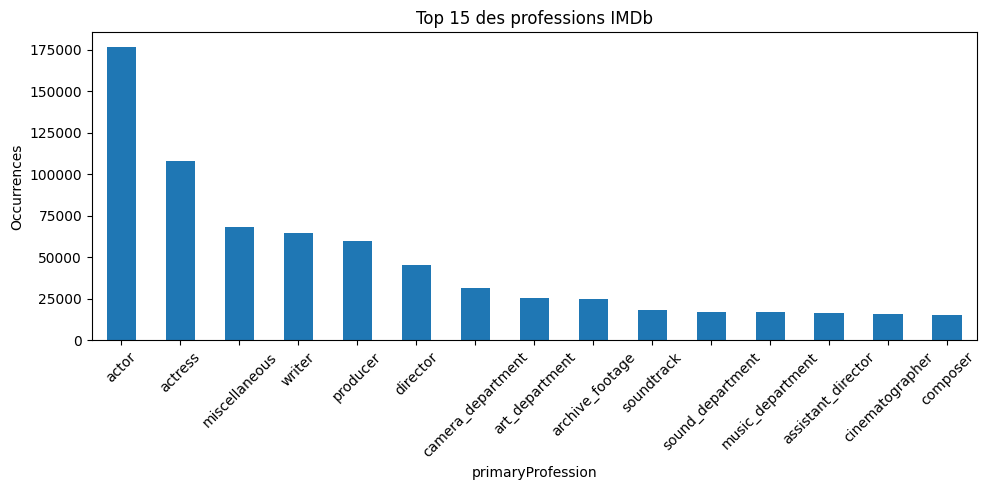

In [ ]:
#top 15 professions du premier chunk
for chunk_loop in chunks_list :
    profs = chunk_loop['primaryProfession'].dropna().str.split(',').explode()

    plt.figure(figsize=(10, 5))
    profs.value_counts().head(15).plot(kind='bar')
    plt.title("Top 15 des professions IMDb")
    plt.ylabel("Occurrences")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    break

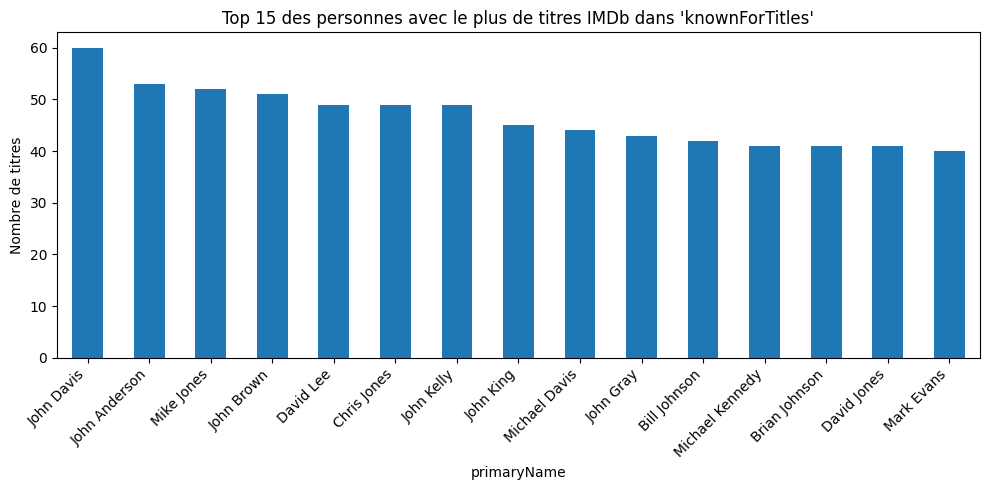

In [ ]:
#les personnes ayant le plus contribués à des oeuvres
for chunk_loop in chunks_list :
    # On garde les personnes ayant des titres connus
    temp = chunk_loop.dropna(subset=['knownForTitles', 'primaryName']).copy()

    # On associe chaque titre à chaque personne
    temp = temp.assign(title_list=temp['knownForTitles'].str.split(',')).explode('title_list')

    # On groupe par nom et compte les titres
    counts = temp.groupby('primaryName')['title_list'].count().sort_values(ascending=False).head(15)

    # Affichage
    plt.figure(figsize=(10, 5))
    counts.plot(kind='bar')
    plt.title("Top 15 des personnes avec le plus de titres IMDb dans 'knownForTitles'")
    plt.ylabel("Nombre de titres")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    break

In [ ]:
# for chunk5 in chunks_list :
#     #créer la colonne 'age'
#     chunk5['age'] = chunk5['deathYear'] - chunk5['birthYear']

#     #replacer les valeurs manquantes de birthYear et deathYear :
#     # x= birthYear, y= deathYear, z= age
#     age_moyen = chunk5['age'].mean(skipna=True)

#     # Remplacer birthYear manquant si deathYear est connu
#     def impute_birth(row):
#         if pd.isna(row['birthYear']) and not pd.isna(row['deathYear']):
#             return int(row['deathYear'] - age_moyen)
#         return row['birthYear']

#     chunk5['birthYear'] = chunk5.apply(impute_birth, axis=1)

#     # Remplacer deathYear manquant si birthYear est connu
#     def impute_death(row):
#         if pd.isna(row['deathYear']) and not pd.isna(row['birthYear']):
#             return int(row['birthYear'] + age_moyen)
#         return row['deathYear']

#     chunk5['deathYear'] = chunk5.apply(impute_death, axis=1)

#     chunk5['age'] = chunk5['deathYear'] - chunk5['birthYear']




In [16]:
for chunk in chunks_list : 
    chunk['age'] = np.where(
        (~chunk['deathYear'].isna() & ~chunk['birthYear'].isna()),              # Si mort connue et naissance connue
        chunk['deathYear'] - chunk['birthYear'],                                # age = mort - naissance
        np.where(
            (~chunk['birthYear'].isna() & chunk['deathYear'].isna()) ,          # Sinon si naissance connue et mort nan
            2025 - chunk['birthYear'],                                          # age = 2025 - naissance
            np.nan                                                              # Sinon on ne sait pas
        )
    )


In [17]:
for chunk in chunks_list:
    chunk.drop(columns=['deathYear', 'birthYear'], inplace=True)  
    chunk.dropna(inplace=True)

In [18]:
for chunk in chunks_list : 
    chunk['age'] = np.where(chunk['age'] < 0, np.nan, chunk['age']) #remplacer quelques valeurs aberrantes 
    # chunk.dropna() # supprimer les valeurs nulles

In [ ]:
description(chunks_list)

description du premier chunk pour tester
-colonnes :  ['nconst', 'primaryName', 'primaryProfession', 'knownForTitles', 'age'] 

- Infos :
<class 'pandas.core.frame.DataFrame'>
Index: 123982 entries, 1 to 499999
Data columns (total 5 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   nconst             123982 non-null  object 
 1   primaryName        123982 non-null  object 
 2   primaryProfession  123982 non-null  object 
 3   knownForTitles     123982 non-null  object 
 4   age                123981 non-null  float64
dtypes: float64(1), object(4)
memory usage: 5.7+ MB

 - Description : 
                 age
count  123981.000000
mean       69.593704
std        15.307483
min         7.000000
25%        59.000000
50%        70.000000
75%        81.000000
max       125.000000

 - Entetes (10 premières lignes) : 
       nconst      primaryName                    primaryProfession  \
1   nm0000002    Lauren Bacall   actress,sound

In [ ]:
size=0
for chunk in chunks_list : 
    size+=chunk.shape[0]

print("taille du dataframe actuelle, nombre de lignes :",size)

taille du dataframe actuelle, nombre de lignes : 526802


In [ ]:
output_file = "cleaned_data_nb.csv.gz"

# boucle sur les morceaux de DataFrame
for i, chunk in enumerate(chunks_list):
    chunk = (chunk[chunk['primaryProfession'].str.contains('actress|actor', na=False, regex=True)])
    # premier chunk ? :  on écrit avec l'en-tête
    if i == 0:
        chunk.to_csv(output_file, index=False, mode='w', header=True, compression='gzip')
    else:
        # sinon, on ajoute sans réécrire l'en-tête
        chunk.to_csv(output_file, index=False, mode='a', header=False, compression='gzip')

## table 2 : title akas

In [39]:
#lecture du CSV créer
chunks_ta=pd.read_csv('title.akas.tsv.gz',
                    compression='gzip',
                    sep='\t',
                    chunksize=500000,
                    na_values='\\N'
                    )
chunks_list_ta = [chunk for chunk in chunks_ta]

C:\Users\Ahcene\AppData\Local\Temp\ipykernel_18420\4144627895.py:8: DtypeWarning:

Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.

C:\Users\Ahcene\AppData\Local\Temp\ipykernel_18420\4144627895.py:8: DtypeWarning:

Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.

C:\Users\Ahcene\AppData\Local\Temp\ipykernel_18420\4144627895.py:8: DtypeWarning:

Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.



In [40]:
#infos de base sur le premier chunk :

description(chunks_list_ta)

description du premier chunk pour tester
-colonnes :  ['titleId', 'ordering', 'title', 'region', 'language', 'types', 'attributes', 'isOriginalTitle'] 

- Infos :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 8 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   titleId          500000 non-null  object
 1   ordering         500000 non-null  int64 
 2   title            500000 non-null  object
 3   region           433278 non-null  object
 4   language         85451 non-null   object
 5   types            399022 non-null  object
 6   attributes       34317 non-null   object
 7   isOriginalTitle  500000 non-null  int64 
dtypes: int64(2), object(6)
memory usage: 30.5+ MB

 - Description : 
            ordering  isOriginalTitle
count  500000.000000    500000.000000
mean        9.529996         0.120696
std         9.719706         0.325774
min         1.000000         0.000000
25%    

In [41]:
uv(chunks_list_ta)

Chunk 1 , sa taille : 500000 lignes et 8 colonnes 
titleId: 60348 valeurs uniques


ordering: 104 valeurs uniques
title: 325886 valeurs uniques
region: 133 valeurs uniques
language: 66 valeurs uniques
types: 14 valeurs uniques
attributes: 118 valeurs uniques
isOriginalTitle: 2 valeurs uniques


In [42]:
null_v (chunks_list_ta)

Chunk 1 , sa taille : 500000 lignes et 8 colonnes 
titleId: 0 valeurs nulles
ordering: 0 valeurs nulles
title: 0 valeurs nulles
region: 66722 valeurs nulles
language: 414549 valeurs nulles
types: 100978 valeurs nulles
attributes: 465683 valeurs nulles
isOriginalTitle: 0 valeurs nulles


In [43]:
for chunk in chunks_list_ta:
    # Nombre de variantes de titre par titleId
    variants_per_title = chunk['titleId'].value_counts().head(10)

    # Répartition des types de titres alternatifs (original, alternative, etc.)
    type_counts = chunk['types'].value_counts(dropna=False).head(10)

    # Répartition des titres originaux vs non originaux
    original_counts = chunk['isOriginalTitle'].value_counts()

    print("Top 10 titleId avec le plus de variantes :")
    display(variants_per_title)

    print("\nTop 10 types de titres :")
    display(type_counts)

    print("\nTitres originaux vs alternatifs (isOriginalTitle) :")
    display(original_counts)

    break


Top 10 titleId avec le plus de variantes :


titleId
tt0056869    104
tt0060196    100
tt0057012     93
tt0029583     91
tt0055928     91
tt0052357     86
tt0050083     84
tt0031381     83
tt0033467     83
tt0038650     82
Name: count, dtype: int64


Top 10 types de titres :


types
imdbDisplay       311660
NaN               100978
original           60348
alternative        11802
working             8899
tv                  3193
dvd                 1394
video               1080
festival             630
imdbDisplaytv         6
Name: count, dtype: int64


Titres originaux vs alternatifs (isOriginalTitle) :


isOriginalTitle
0    439652
1     60348
Name: count, dtype: int64

In [44]:
description(chunks_list_ta)

description du premier chunk pour tester
-colonnes :  ['titleId', 'ordering', 'title', 'region', 'language', 'types', 'attributes', 'isOriginalTitle'] 

- Infos :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 8 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   titleId          500000 non-null  object
 1   ordering         500000 non-null  int64 
 2   title            500000 non-null  object
 3   region           433278 non-null  object
 4   language         85451 non-null   object
 5   types            399022 non-null  object
 6   attributes       34317 non-null   object
 7   isOriginalTitle  500000 non-null  int64 
dtypes: int64(2), object(6)
memory usage: 30.5+ MB

 - Description : 
            ordering  isOriginalTitle
count  500000.000000    500000.000000
mean        9.529996         0.120696
std         9.719706         0.325774
min         1.000000         0.000000
25%    

In [45]:
for chunk in chunks_list_ta:
    # Supprimer les NaN puis splitter sur ',' et exploser
    titres = chunk['titleId'].dropna().str.split(',').explode()

    # Top 15 des titres les plus cités
    top_title_ids = titres.value_counts().head(15).index.tolist()

    print("Top 15 titleId les plus fréquents :")
    print(top_title_ids)
    break


Top 15 titleId les plus fréquents :
['tt0056869', 'tt0060196', 'tt0057012', 'tt0029583', 'tt0055928', 'tt0052357', 'tt0050083', 'tt0031381', 'tt0033467', 'tt0038650', 'tt0058461', 'tt0047396', 'tt0053291', 'tt0047478', 'tt0059578']


In [46]:
for chunk in chunks_list_ta:
    # Ne garder que les titres originaux
    originaux = chunk[chunk['isOriginalTitle'] == 1]

    # Filtrer par ID
    mapping = originaux[originaux['titleId'].isin(top_title_ids)]

    # Affichage : titre lisible + langue + région
    display(mapping)
    break


,titleId,ordering,title,region,language,types,attributes,isOriginalTitle
163365,tt0029583,1,Snow White and the Seven Dwarfs,NaN,NaN,original,NaN,1
178700,tt0031381,1,Gone with the Wind,NaN,NaN,original,NaN,1
196938,tt0033467,1,Citizen Kane,NaN,NaN,original,NaN,1
243008,tt0038650,1,It's a Wonderful Life,NaN,NaN,original,NaN,1
335969,tt0047396,1,Rear Window,NaN,NaN,original,NaN,1
337123,tt0047478,1,Shichinin no samurai,NaN,NaN,original,NaN,1
366249,tt0050083,1,12 Angry Men,NaN,NaN,original,NaN,1
392254,tt0052357,1,Vertigo,NaN,NaN,original,NaN,1
403359,tt0053291,1,Some Like It Hot,NaN,NaN,original,NaN,1
433144,tt0055928,1,Dr. No,NaN,NaN,original,NaN,1


In [47]:
null_v_all_chunks(chunks_list_ta)


Total de valeurs nulles par colonne (tous chunks confondus) :
titleId : 0 valeurs nulles
ordering : 0 valeurs nulles
title : 41 valeurs nulles
region : 11688336 valeurs nulles
language : 17191705 valeurs nulles
types : 35994087 valeurs nulles
attributes : 51643290 valeurs nulles
isOriginalTitle : 0 valeurs nulles


In [48]:
# for cg

In [49]:
# from langdetect import detect, DetectorFactory
# from langdetect.lang_detect_exception import LangDetectException
# DetectorFactory.seed = 0  # pour des résultats reproductibles

# def detect_language(text):
#     try:
#         return detect(text)
#     except LangDetectException :
#         return np.nan

In [50]:

    # # appliquer la fonction quand c'est language is null & isOriginalTitle vaut 1
    # for chunk in chunks_list_ta:
        
    #     mask = (chunk['language'].isna()) & (chunk['isOriginalTitle'] == 1)
            
    #     chunk.loc[mask, 'language'] = chunk.loc[mask, 'title'].apply(detect_language)

    

## table 3 : title basic

In [6]:
#lecture du CSV créer
chunks_tb=pd.read_csv('title.basics.tsv.gz',
                    compression='gzip',
                    sep='\t',
                    chunksize=500000,
                    na_values='\\N'
                    )
chunks_list_tb = [chunk.dropna() for chunk in chunks_tb]

C:\Users\Ahcene\AppData\Local\Temp\ipykernel_7064\1537606999.py:8: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  chunks_list_tb = [chunk.dropna() for chunk in chunks_tb]
C:\Users\Ahcene\AppData\Local\Temp\ipykernel_7064\1537606999.py:8: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  chunks_list_tb = [chunk.dropna() for chunk in chunks_tb]
C:\Users\Ahcene\AppData\Local\Temp\ipykernel_7064\1537606999.py:8: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  chunks_list_tb = [chunk.dropna() for chunk in chunks_tb]
C:\Users\Ahcene\AppData\Local\Temp\ipykernel_7064\1537606999.py:8: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  chunks_list_tb = [chunk.dropna() for chunk in chunks_tb]
C:\Users\Ahcene\AppData\Local\Temp\ipykernel_7064\1537606999.py:8: DtypeWarning: Columns (7) hav

In [5]:
description(chunks_list_tb)

NameError: name 'description' is not defined

In [ ]:
uv(chunks_list_tb)

Chunk 1 , sa taille : 500000 lignes et 9 colonnes 
tconst: 500000 valeurs uniques
titleType: 10 valeurs uniques
primaryTitle: 434650 valeurs uniques
originalTitle: 440875 valeurs uniques
isAdult: 2 valeurs uniques
startYear: 139 valeurs uniques
endYear: 84 valeurs uniques
runtimeMinutes: 552 valeurs uniques
genres: 1643 valeurs uniques


In [ ]:
null_v(chunks_list_tb)

Chunk 1 , sa taille : 500000 lignes et 9 colonnes 
tconst: 0 valeurs nulles


titleType: 0 valeurs nulles
primaryTitle: 0 valeurs nulles
originalTitle: 0 valeurs nulles
isAdult: 0 valeurs nulles
startYear: 1081 valeurs nulles
endYear: 479133 valeurs nulles
runtimeMinutes: 147065 valeurs nulles
genres: 49356 valeurs nulles


In [ ]:
# count total des movies
total_films = 0

for chunk in chunks_list_tb:
    total_films += (chunk['titleType'] == 'movie').sum()

print(f"Nombre total de films : {total_films}")


Nombre total de films : 714452


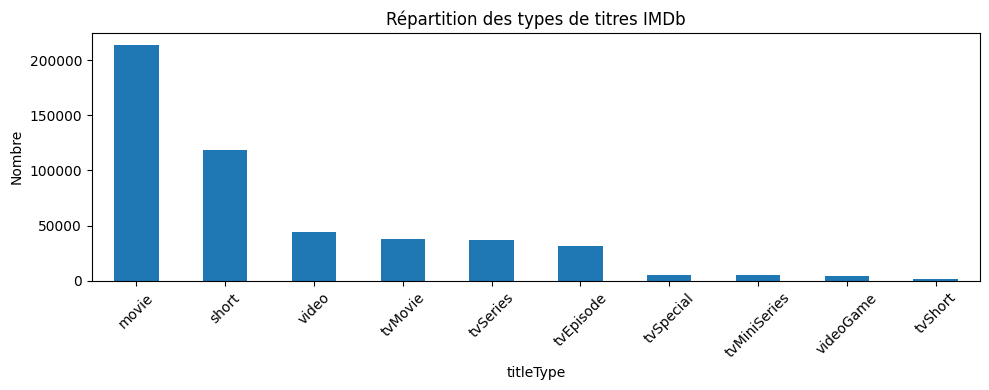

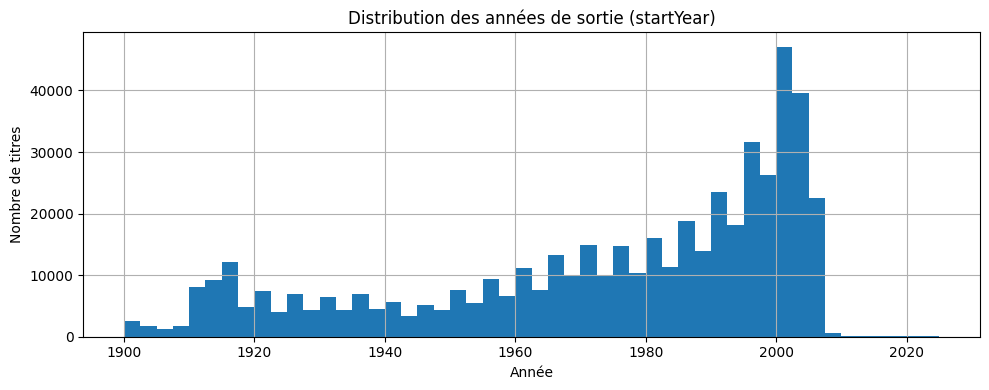

In [ ]:
for chunk in chunks_list_tb:
    # Distribution des types de titres
    title_type_counts = chunk['titleType'].value_counts().head(10)

    # Années de sortie valides (filtrage des NaN et valeurs aberrantes)

    chunk['startYear'] = pd.to_numeric(chunk['startYear'], errors='coerce')

    # Filtrer les années plausibles
    years = chunk['startYear'].dropna()
    years = years[(years >= 1900) & (years <= 2025)]

    plt.figure(figsize=(10, 4))
    title_type_counts.plot(kind='bar')
    plt.title("Répartition des types de titres IMDb")
    plt.ylabel("Nombre")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(10, 4))
    years.hist(bins=50)
    plt.title("Distribution des années de sortie (startYear)")
    plt.xlabel("Année")
    plt.ylabel("Nombre de titres")
    plt.tight_layout()
    plt.show()

    break


## table 4 : title crew

In [ ]:
#lecture du CSV créer
chunks_tc=pd.read_csv('title.crew.tsv.gz',
                    compression='gzip',
                    sep='\t',
                    chunksize=500000,
                    na_values='\\N'
                    )
chunks_list_tc = [chunk for chunk in chunks_tc]

In [ ]:
description(chunks_list_tc)

description du premier chunk pour tester
-colonnes :  ['tconst', 'directors', 'writers'] 

- Infos :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 3 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   tconst     500000 non-null  object
 1   directors  442614 non-null  object
 2   writers    349798 non-null  object
dtypes: object(3)
memory usage: 11.4+ MB

 - Descroption : 
           tconst  directors    writers
count      500000     442614     349798
unique     500000     128706     227394
top     tt0520631  nm0617588  nm0193721
freq            1        514        451

 - Entetes (10 premières lignes) : 
      tconst            directors    writers
0  tt0000001            nm0005690        NaN
1  tt0000002            nm0721526        NaN
2  tt0000003            nm0721526  nm0721526
3  tt0000004            nm0721526        NaN
4  tt0000005            nm0005690        NaN
5  tt0000006          

In [ ]:
uv(chunks_list_tc)

Chunk 1 , sa taille : 500000 lignes et 3 colonnes 
tconst: 500000 valeurs uniques
directors: 128706 valeurs uniques
writers: 227394 valeurs uniques


In [ ]:
null_v(chunks_list_tc)

Chunk 1 , sa taille : 500000 lignes et 3 colonnes 
tconst: 0 valeurs nulles
directors: 57386 valeurs nulles
writers: 150202 valeurs nulles


In [ ]:
for chunk in chunks_list_tc:
    # Combien de titres avec au moins un réalisateur
    n_with_director = chunk['directors'].notna().sum()

    # Combien de titres avec au moins un scénariste
    n_with_writer = chunk['writers'].notna().sum()

    print(f"Titres avec réalisateur : {n_with_director}")
    print(f"Titres avec scénariste : {n_with_writer}")

    # Fréquence des réalisateurs (explosés)
    directors = chunk['directors'].dropna().str.split(',').explode()
    top_directors = directors.value_counts().head(10)

    # Fréquence des scénaristes (explosés)
    writers = chunk['writers'].dropna().str.split(',').explode()
    top_writers = writers.value_counts().head(10)

    print("\nTop 10 des réalisateurs (nconst) :")
    display(top_directors)

    print("\nTop 10 des scénaristes (nconst) :")
    display(top_writers)

    break


Titres avec réalisateur : 442614
Titres avec scénariste : 349798

Top 10 des réalisateurs (nconst) :


directors
nm0281487    637
nm0000428    520
nm0617588    517
nm0622051    487
nm0924920    435
nm0001908    400
nm0160280    393
nm0460667    392
nm0275421    389
nm0064415    377
Name: count, dtype: int64


Top 10 des scénaristes (nconst) :


writers
nm0000636    757
nm0856056    603
nm0193721    566
nm0004798    451
nm0907778    406
nm0607334    406
nm0004170    374
nm0400403    321
nm0279404    312
nm0075276    307
Name: count, dtype: int64

In [ ]:

for chunk in chunks_list_tc :
    top_directors = chunk['directors'].dropna().str.split(',').explode().value_counts().head(10)
    top_directors_ids = top_directors.index.tolist()
    break



matched_chunks = []
for chunk in chunks_list:
    matched_names = chunk[chunk['nconst'].isin(top_directors_ids)]
    matched_chunks.append(matched_names)


In [ ]:


matched_names = pd.concat(matched_chunks)

df_map = pd.DataFrame(top_directors).reset_index()
df_map.columns = ['nconst', 'count']
df_final = df_map.merge(matched_names[['nconst', 'primaryName']],
                        on='nconst',
                        how='left')

display(df_final[['primaryName', 'count']])

,primaryName,count
0,Dave Fleischer,637
1,D.W. Griffith,520
2,Georges Méliès,517
3,Jim Powers,487
4,James H. White,435
5,Gilbert M. 'Broncho Billy' Anderson,400
6,Al Christie,393
7,Seymour Kneitel,392
8,Louis Feuillade,389
9,William Beaudine,377


## table 5 : title episode

In [155]:

#lecture du CSV créer
chunks_te=pd.read_csv('title.episode.tsv.gz',
                    compression='gzip',
                    sep='\t',
                    chunksize=500000,
                    na_values='\\N'
                    )
chunks_list_te = [chunk for chunk in chunks_te]

In [156]:
description(chunks_list_te)

description du premier chunk pour tester
-colonnes :  ['tconst', 'parentTconst', 'seasonNumber', 'episodeNumber'] 

- Infos :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 4 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   tconst         500000 non-null  object 
 1   parentTconst   500000 non-null  object 
 2   seasonNumber   417289 non-null  float64
 3   episodeNumber  417289 non-null  float64
dtypes: float64(2), object(2)
memory usage: 15.3+ MB

 - Description : 
        seasonNumber  episodeNumber
count  417289.000000  417289.000000
mean        4.146958     213.713810
std        27.731253    1138.039803
min         1.000000       0.000000
25%         1.000000       5.000000
50%         2.000000      11.000000
75%         4.000000      26.000000
max      2005.000000   48505.000000

 - Entetes (10 premières lignes) : 
      tconst parentTconst  seasonNumber  episodeNumber
0  tt0

In [157]:
uv(chunks_list_te)

Chunk 1 , sa taille : 500000 lignes et 4 colonnes 
tconst: 500000 valeurs uniques
parentTconst: 21794 valeurs uniques
seasonNumber: 111 valeurs uniques
episodeNumber: 9100 valeurs uniques


In [158]:
null_v(chunks_list_te)

Chunk 1 , sa taille : 500000 lignes et 4 colonnes 
tconst: 0 valeurs nulles
parentTconst: 0 valeurs nulles
seasonNumber: 82711 valeurs nulles
episodeNumber: 82711 valeurs nulles


## table 6 : title principals

In [44]:
#récupérer les 10 premiers chunks seulement

chunks_tp = pd.read_csv('title.principals.tsv.gz',
                        compression='gzip',
                        sep='\t',
                        chunksize=1000000,
                        na_values='\\N')

chunks_list_tp = [chunk.dropna() for chunk in chunks_tp]

In [45]:
description(chunks_list_tp)

description du premier chunk pour tester
-colonnes :  ['tconst', 'ordering', 'nconst', 'category', 'job', 'characters'] 

- Infos :
<class 'pandas.core.frame.DataFrame'>
Index: 0 entries
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   tconst      0 non-null      object
 1   ordering    0 non-null      int64 
 2   nconst      0 non-null      object
 3   category    0 non-null      object
 4   job         0 non-null      object
 5   characters  0 non-null      object
dtypes: int64(1), object(5)
memory usage: 0.0+ bytes

 - Description : 
       ordering
count       0.0
mean        NaN
std         NaN
min         NaN
25%         NaN
50%         NaN
75%         NaN
max         NaN

 - Entetes (10 premières lignes) : 
Empty DataFrame
Columns: [tconst, ordering, nconst, category, job, characters]
Index: []


In [ ]:
uv(chunks_list_tp_5premiers)

Chunk 1 , sa taille : 1000000 lignes et 6 colonnes 
tconst: 70816 valeurs uniques
ordering: 44 valeurs uniques
nconst: 163515 valeurs uniques
category: 13 valeurs uniques
job: 9096 valeurs uniques
characters: 354621 valeurs uniques


In [ ]:
null_v(chunks_list_tp_5premiers)

Chunk 1 , sa taille : 1000000 lignes et 6 colonnes 
tconst: 0 valeurs nulles
ordering: 0 valeurs nulles
nconst: 0 valeurs nulles
category: 0 valeurs nulles
job: 801531 valeurs nulles
characters: 450751 valeurs nulles


## table 7 : title ratings

In [159]:
#lecture du CSV créer
chunks_tr=pd.read_csv('title.ratings.tsv.gz',
                    compression='gzip',
                    sep='\t',
                    chunksize=500000,
                    na_values='\\N'
                    )
chunks_list_tr = [chunk for chunk in chunks_tr]

In [160]:
description(chunks_list_tr)

description du premier chunk pour tester
-colonnes :  ['tconst', 'averageRating', 'numVotes'] 

- Infos :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 3 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   tconst         500000 non-null  object 
 1   averageRating  500000 non-null  float64
 2   numVotes       500000 non-null  int64  
dtypes: float64(1), int64(1), object(1)
memory usage: 11.4+ MB

 - Description : 
       averageRating      numVotes
count  500000.000000  5.000000e+05
mean        6.707039  1.619707e+03
std         1.304017  2.533569e+04
min         1.000000  5.000000e+00
25%         5.900000  1.700000e+01
50%         6.900000  4.200000e+01
75%         7.600000  1.540000e+02
max        10.000000  3.041757e+06

 - Entetes (10 premières lignes) : 
      tconst  averageRating  numVotes
0  tt0000001            5.7      2156
1  tt0000002            5.5       292
2  tt000000

In [161]:
uv(chunks_list_tr)

Chunk 1 , sa taille : 500000 lignes et 3 colonnes 
tconst: 500000 valeurs uniques
averageRating: 91 valeurs uniques
numVotes: 14870 valeurs uniques


In [164]:
null_v(chunks_list_tr)

Chunk 1 , sa taille : 500000 lignes et 3 colonnes 
tconst: 0 valeurs nulles
averageRating: 0 valeurs nulles
numVotes: 0 valeurs nulles


In [165]:
for chunk in chunks_list_tr :
    fig_ar = px.box(chunk,
                x='averageRating',
                title="Boxplot de vote :")

    fig_ar.show()
    fig_nv = px.box(chunk,
                x='numVotes',
                title="Boxplot de nombres de votants :")
    fig_nv.show()
    break

## KPI

In [43]:
description(chunks_list_tp)

description du premier chunk pour tester
-colonnes :  ['tconst', 'ordering', 'nconst', 'category', 'job', 'characters'] 

- Infos :
<class 'pandas.core.frame.DataFrame'>
Index: 0 entries
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   tconst      0 non-null      object
 1   ordering    0 non-null      int64 
 2   nconst      0 non-null      object
 3   category    0 non-null      object
 4   job         0 non-null      object
 5   characters  0 non-null      object
dtypes: int64(1), object(5)
memory usage: 0.0+ bytes

 - Description : 
       ordering
count       0.0
mean        NaN
std         NaN
min         NaN
25%         NaN
50%         NaN
75%         NaN
max         NaN

 - Entetes (10 premières lignes) : 
Empty DataFrame
Columns: [tconst, ordering, nconst, category, job, characters]
Index: []


## table 8 tmdb CSV : importation et nettoyage de données et de la table

In [97]:
#lecture du CSV créer
chunks_tmdb=pd.read_csv('tmdb_full.csv',
                    chunksize=500000,
                    sep=','
                    # na_values='\\N'
                    )
chunks_list_tmdb = [chunk for chunk in chunks_tmdb]

C:\Users\Ahcene\AppData\Local\Temp\ipykernel_22628\2413866732.py:7: DtypeWarning: Columns (24) have mixed types. Specify dtype option on import or set low_memory=False.
  chunks_list_tmdb = [chunk for chunk in chunks_tmdb]


In [98]:
description(chunks_list_tmdb)

description du premier chunk pour tester
-colonnes :  ['adult', 'backdrop_path', 'budget', 'genres', 'homepage', 'id', 'imdb_id', 'original_language', 'original_title', 'overview', 'popularity', 'poster_path', 'production_countries', 'release_date', 'revenue', 'runtime', 'spoken_languages', 'status', 'tagline', 'title', 'video', 'vote_average', 'vote_count', 'production_companies_name', 'production_companies_country'] 

- Infos :
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309572 entries, 0 to 309571
Data columns (total 25 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   adult                         309572 non-null  bool   
 1   backdrop_path                 151760 non-null  object 
 2   budget                        309572 non-null  int64  
 3   genres                        309572 non-null  object 
 4   homepage                      44262 non-null   object 
 5   id                            

In [99]:
null_v(chunks_list_tmdb)

Chunk 1 , sa taille : 309572 lignes et 25 colonnes 
adult: 0 valeurs nulles
backdrop_path: 157812 valeurs nulles
budget: 0 valeurs nulles
genres: 0 valeurs nulles
homepage: 265310 valeurs nulles
id: 0 valeurs nulles
imdb_id: 0 valeurs nulles
original_language: 0 valeurs nulles
original_title: 0 valeurs nulles
overview: 27060 valeurs nulles
popularity: 0 valeurs nulles
poster_path: 45413 valeurs nulles
production_countries: 0 valeurs nulles
release_date: 8233 valeurs nulles
revenue: 0 valeurs nulles
runtime: 0 valeurs nulles
spoken_languages: 0 valeurs nulles
status: 0 valeurs nulles
tagline: 234999 valeurs nulles
title: 0 valeurs nulles
video: 0 valeurs nulles
vote_average: 0 valeurs nulles
vote_count: 0 valeurs nulles
production_companies_name: 0 valeurs nulles
production_companies_country: 145134 valeurs nulles


In [100]:
chunks_list_tmdb = [chunk.drop(columns=['backdrop_path', 'homepage', 'tagline', 'production_companies_country']) for chunk in chunks_list_tmdb]

In [101]:
null_v(chunks_list_tmdb)

Chunk 1 , sa taille : 309572 lignes et 21 colonnes 
adult: 0 valeurs nulles
budget: 0 valeurs nulles
genres: 0 valeurs nulles
id: 0 valeurs nulles
imdb_id: 0 valeurs nulles
original_language: 0 valeurs nulles
original_title: 0 valeurs nulles
overview: 27060 valeurs nulles
popularity: 0 valeurs nulles
poster_path: 45413 valeurs nulles
production_countries: 0 valeurs nulles
release_date: 8233 valeurs nulles
revenue: 0 valeurs nulles
runtime: 0 valeurs nulles
spoken_languages: 0 valeurs nulles
status: 0 valeurs nulles
title: 0 valeurs nulles
video: 0 valeurs nulles
vote_average: 0 valeurs nulles
vote_count: 0 valeurs nulles
production_companies_name: 0 valeurs nulles


In [102]:
chunks_list_tmdb = [chunk.dropna(subset=['overview', 'poster_path', 'release_date']) for chunk in chunks_list_tmdb]

In [103]:
null_v(chunks_list_tmdb)

Chunk 1 , sa taille : 242405 lignes et 21 colonnes 
adult: 0 valeurs nulles
budget: 0 valeurs nulles
genres: 0 valeurs nulles
id: 0 valeurs nulles
imdb_id: 0 valeurs nulles
original_language: 0 valeurs nulles
original_title: 0 valeurs nulles
overview: 0 valeurs nulles
popularity: 0 valeurs nulles
poster_path: 0 valeurs nulles
production_countries: 0 valeurs nulles
release_date: 0 valeurs nulles
revenue: 0 valeurs nulles
runtime: 0 valeurs nulles
spoken_languages: 0 valeurs nulles
status: 0 valeurs nulles
title: 0 valeurs nulles
video: 0 valeurs nulles
vote_average: 0 valeurs nulles
vote_count: 0 valeurs nulles
production_companies_name: 0 valeurs nulles


In [104]:
data_tmdb = pd.concat(chunks_list_tmdb, ignore_index=True)
data_tmdb.head()

,adult,budget,genres,id,imdb_id,original_language,original_title,overview,popularity,poster_path,...,release_date,revenue,runtime,spoken_languages,status,title,video,vote_average,vote_count,production_companies_name
0,False,0,['Comedy'],3924,tt0029927,en,Blondie,Blondie and Dagwood are about to celebrate the...,2.852,/zBiHKhXklvTFwj4M1uEUcQGAVJ.jpg,...,1938-11-30,0,70,['en'],Released,Blondie,False,7.214,7,['Columbia Pictures']
1,False,0,"['Drama', 'Romance']",8773,tt0055747,fr,L'Amour à vingt ans,Love at Twenty unites five directors from five...,3.770,/aup2QCYCsyEeQfpboXy0f4uj8aE.jpg,...,1962-06-22,0,110,"['it', 'ja', 'pl', 'fr', 'de']",Released,Love at Twenty,False,6.700,41,"['Ulysse Productions', 'Unitec Films', 'Cinese..."
2,False,0,"['Drama', 'Comedy', 'Crime']",2,tt0094675,fi,Ariel,Taisto Kasurinen is a Finnish coal miner whose...,9.214,/ojDg0PGvs6R9xYFodRct2kdI6wC.jpg,...,1988-10-21,0,73,['fi'],Released,Ariel,False,7.046,248,['Villealfa Filmproductions']
3,False,0,"['Drama', 'Comedy', 'Romance']",3,tt0092149,fi,Varjoja paratiisissa,"An episode in the life of Nikander, a garbage ...",6.282,/nj01hspawPof0mJmlgfjuLyJuRN.jpg,...,1986-10-17,0,76,['en'],Released,Shadows in Paradise,False,7.182,269,['Villealfa Filmproductions']
4,False,4000000,"['Crime', 'Comedy']",5,tt0113101,en,Four Rooms,It's Ted the Bellhop's first night on the job....,18.734,/75aHn1NOYXh4M7L5shoeQ6NGykP.jpg,...,1995-12-09,4257354,98,['en'],Released,Four Rooms,False,5.758,2357,"['Miramax', 'A Band Apart']"


In [105]:
data_tmdb.columns

Index(['adult', 'budget', 'genres', 'id', 'imdb_id', 'original_language',
       'original_title', 'overview', 'popularity', 'poster_path',
       'production_countries', 'release_date', 'revenue', 'runtime',
       'spoken_languages', 'status', 'title', 'video', 'vote_average',
       'vote_count', 'production_companies_name'],
      dtype='object')

<Axes: >

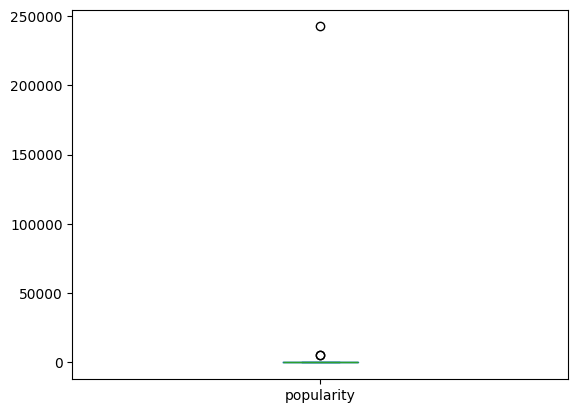

In [106]:
data_tmdb['popularity'].describe(np.arange(0,1.1,0.1)).plot(kind='box')

In [107]:
data_tmdb['popularity'].describe(np.arange(0,1.1,0.1))

count    242405.000000
mean          3.230102
std          23.924186
min           0.600000
0%            0.600000
10%           0.600000
20%           0.621000
30%           0.840000
40%           1.021000
50%           1.331000
60%           1.529000
70%           2.082000
80%           3.174000
90%           6.185000
100%       5089.969000
max        5089.969000
Name: popularity, dtype: float64

In [108]:
data_tmdb.columns

Index(['adult', 'budget', 'genres', 'id', 'imdb_id', 'original_language',
       'original_title', 'overview', 'popularity', 'poster_path',
       'production_countries', 'release_date', 'revenue', 'runtime',
       'spoken_languages', 'status', 'title', 'video', 'vote_average',
       'vote_count', 'production_companies_name'],
      dtype='object')

In [109]:
base_url = "https://image.tmdb.org/t/p/w500"

for element  in data_tmdb['poster_path'].iloc[:2] :
    poster_url = base_url + element 
    print(poster_url)


https://image.tmdb.org/t/p/w500/zBiHKhXklvTFwj4M1uEUcQGAVJ.jpg
https://image.tmdb.org/t/p/w500/aup2QCYCsyEeQfpboXy0f4uj8aE.jpg


In [110]:
data_tmdb['poster_url'] = data_tmdb['poster_path'].apply(lambda x : base_url + x)

In [111]:
for ele in data_tmdb['poster_url'].iloc[:5] :
    print(ele)

https://image.tmdb.org/t/p/w500/zBiHKhXklvTFwj4M1uEUcQGAVJ.jpg
https://image.tmdb.org/t/p/w500/aup2QCYCsyEeQfpboXy0f4uj8aE.jpg
https://image.tmdb.org/t/p/w500/ojDg0PGvs6R9xYFodRct2kdI6wC.jpg
https://image.tmdb.org/t/p/w500/nj01hspawPof0mJmlgfjuLyJuRN.jpg
https://image.tmdb.org/t/p/w500/75aHn1NOYXh4M7L5shoeQ6NGykP.jpg


In [112]:
data_tmdb=data_tmdb[data_tmdb['adult'] == False]

data_tmdb.drop(columns=['poster_path'], inplace=True)

data_tmdb['release_date'] = pd.to_datetime(data_tmdb['release_date'])

data_tmdb=data_tmdb[data_tmdb['status']=='Released']

data_tmdb=data_tmdb[data_tmdb['video'] == False]

data_tmdb.drop(columns=['video', 'adult', 'status'], inplace=True)
# data_tmdb = data_tmdb[data_tmdb['release_date'].dt.year > (1980)]

seuil = data_tmdb['popularity'].quantile(0.99)
data_tmdb = data_tmdb[data_tmdb['popularity'] <= seuil]

#### Commentaires sur le nettoyage de données :
    Suppression des colonnes :
       - backdrop_path et homepage : non pertinentes à l'analyse,

    Suppression de films pour adultes,
    Mettre la date de réalisation en format datetime,
    Garder que les films ayant un statu réalisé,
    Garder que les films, suppression de courts métrages : colonne 'video' est false,
    Suppression des colonnes :
        - tagline non pertinente,
        - video, adult, et status : déjà filtrer auparavant

    Indice de popularité, comme vu avec le boxplot de l'indice de popularité, on en recense beaucoup de valeurs aberrantes (outilers), on a donc décidé de prendre la méthode .quartile(99%) => ce qui donne qu’on garde 99% des films où l’indice de popularité est le moins extrême donc, on élimine les outliers.

In [113]:
description_dataframe(data_tmdb)

description du dataframe
-colonnes :  ['budget', 'genres', 'id', 'imdb_id', 'original_language', 'original_title', 'overview', 'popularity', 'production_countries', 'release_date', 'revenue', 'runtime', 'spoken_languages', 'title', 'vote_average', 'vote_count', 'production_companies_name', 'poster_url'] 

- Infos du dataframe :


<class 'pandas.core.frame.DataFrame'>
Index: 234759 entries, 0 to 242403
Data columns (total 18 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   budget                     234759 non-null  int64         
 1   genres                     234759 non-null  object        
 2   id                         234759 non-null  int64         
 3   imdb_id                    234759 non-null  object        
 4   original_language          234759 non-null  object        
 5   original_title             234759 non-null  object        
 6   overview                   234759 non-null  object        
 7   popularity                 234759 non-null  float64       
 8   production_countries       234759 non-null  object        
 9   release_date               234759 non-null  datetime64[ns]
 10  revenue                    234759 non-null  int64         
 11  runtime                    234759 non-null  int64        

In [114]:
null_v_df(data_tmdb)

la dataframe, sa taille : 234759 lignes et 18 colonnes 
budget: 0 valeurs nulles
genres: 0 valeurs nulles
id: 0 valeurs nulles


imdb_id: 0 valeurs nulles
original_language: 0 valeurs nulles
original_title: 0 valeurs nulles
overview: 0 valeurs nulles
popularity: 0 valeurs nulles
production_countries: 0 valeurs nulles
release_date: 0 valeurs nulles
revenue: 0 valeurs nulles
runtime: 0 valeurs nulles
spoken_languages: 0 valeurs nulles
title: 0 valeurs nulles
vote_average: 0 valeurs nulles
vote_count: 0 valeurs nulles
production_companies_name: 0 valeurs nulles
poster_url: 0 valeurs nulles


## ML : implémentation du modèle de macing learning cosinus

### **DEPLOIEMENT ML**

In [115]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

### préparation des colonnes traitement avant de passer sur le modèle ML

In [116]:
titres_dupliques = data_tmdb['title'].value_counts()
titres_dupliques = titres_dupliques[titres_dupliques > 1]
print(titres_dupliques)

title
Alone               30
Home                29
Mother              28
First Love          25
Love                25
                    ..
Ariel                2
American Beauty      2
Pattampoochi         2
Ema                  2
Six Days in June     2
Name: count, Length: 14702, dtype: int64


In [117]:
data_tmdb['title_cleaned'] = data_tmdb['title']  # copie de base

# grouper les doublons, trier par date, et ajouter un suffixe (1), (2), ...
data_tmdb['title'] = (
    data_tmdb
    .sort_values(['title_cleaned', 'release_date'])
    .groupby('title_cleaned')
    .cumcount()
    .add(1)
    .astype(str)
    .radd(' ')
    .radd(data_tmdb['title_cleaned'])
    .radd('')
)
data_tmdb.drop(columns='title_cleaned', inplace=True)

In [118]:
# vérification 
titres_dupliques = data_tmdb['title'].value_counts()
titres_dupliques = titres_dupliques[titres_dupliques > 1]
print(titres_dupliques)

Series([], Name: count, dtype: int64)


In [119]:
data_tmdb['genres'].head(5)

0                        ['Comedy']
1              ['Drama', 'Romance']
2      ['Drama', 'Comedy', 'Crime']
3    ['Drama', 'Comedy', 'Romance']
4               ['Crime', 'Comedy']
Name: genres, dtype: object

In [120]:
# séparer le format de la colonne genre 
data_tmdb['genres'] = data_tmdb['genres'].apply(
    lambda x : ' '.join(
        x.replace("[", "").replace("]", "").replace("'","").split(","))
        )


In [121]:
data_tmdb['genres'].head()

0                    Comedy
1            Drama  Romance
2      Drama  Comedy  Crime
3    Drama  Comedy  Romance
4             Crime  Comedy
Name: genres, dtype: object

In [122]:
# Créer une nouvelle colonne combinée
data_tmdb['text_features'] = data_tmdb['overview'] + ' ' + data_tmdb['genres']

# Vérification
data_tmdb[['title', 'text_features']].head()

,title,text_features
0,Blondie 1,Blondie and Dagwood are about to celebrate the...
1,Love at Twenty 1,Love at Twenty unites five directors from five...
2,Ariel 1,Taisto Kasurinen is a Finnish coal miner whose...
3,Shadows in Paradise 1,"An episode in the life of Nikander, a garbage ..."
4,Four Rooms 1,It's Ted the Bellhop's first night on the job....


In [123]:
#nettoyage de text_features : 
data_tmdb['text_features'] = data_tmdb['text_features'].str.lower()
import string
data_tmdb['text_features'] = data_tmdb['text_features'].apply(nettoyer_texte)
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
mots_vides = stopwords.words('english') 

data_tmdb['text_features'] = data_tmdb['text_features'].apply(lambda x : ' '.join([word for word in x.split() if word not in mots_vides]))


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Ahcene\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [124]:
# Vérification
data_tmdb[['title', 'text_features']].head()

,title,text_features
0,Blondie 1,blondie dagwood celebrate fifth wedding annive...
1,Love at Twenty 1,love twenty unites five directors five differe...
2,Ariel 1,taisto kasurinen finnish coal miner whose fath...
3,Shadows in Paradise 1,episode life nikander garbage man involving de...
4,Four Rooms 1,ted bellhops first night joband hotels unusual...


In [125]:
#implélementation du modèle de maching learning et le fit

#initialiser le vectorizer 
tfidf = TfidfVectorizer(stop_words='english')

#l'appliquer à la colonne 'text_features' et la création de la matrice
tfidf_matrix =tfidf.fit_transform(data_tmdb['text_features'])

# donc la matrice aurait ce shape, où chaque films 234759 est composé de 228716 mots unique
tfidf_matrix.shape

(234759, 228716)

- donc la matrice aurait ce shape, où chaque films 234759 est composé de 228716 mots unique

### **PROBLEME DE RAM sans issu, à ne pas relancer** 
on laisse tomber IF IDF cosinuse similarité, on part sur un modèle KNN sur matrice if idf

In [ ]:
# calculer la similarité cosinus entre tous les films
cosine_sim = cosine_similarity(tfidf_matrix, tfidf_matrix)

# affichage de la taille de la matrice : 
print('la taille de la matrice de similarité', cosine_sim.shape)

MemoryError: Unable to allocate 178. GiB for an array with shape (23848846194,) and data type int64

In [136]:
#créer la série indices qui reprend tous les titles de films en miniscules et en enlevant les espaces invisibles avec strip()

indices = pd.Series(data_tmdb.index, index=data_tmdb['title'].str.strip().str.lower())


In [137]:
# créationde la fonction recommandation_film 

def recommandation_film(title, n=6) :

    title = title.strip().lower()

    if title not in indices :
        print(f'film no trouvé dans la liste de notre base de donnée, recommandation non possible, \
              veuillez resaisir un autre film') 

    index_du_film = indices[title] # on recupere l'indice de film depuis son title de la datafram

    liste_similarites  = list(enumerate(cosine_sim[index_du_film].flatten()))  
    #on regarde à quel point un film resemble aux autres films de notre dataframe
    #cosine_sim donne la similarité avec tous les autres films 
    #enumerate ajoute le numéro du film à chaque score
    #on met ça dans une liste

    similarites_tries = sorted(liste_similarites, key=lambda x: x[1], reverse=True)
    similarites_tries = [sim for sim in similarites_tries if sim[0] != index_du_film]
    films_similaires = similarites_tries[:n]

    #on trie les similarités et on ignore la similarité du film avec lui même donc, on prend un slicing 1 à n+1

    indices_recommandes = []
    for film in films_similaires:
        index_similaire = film[0]
        indices_recommandes.append(index_similaire)
    #on parcours la liste de films_similaires
    #on prend l'indexe 0 du films_similaires cad l'indexe du film 
    # indices_recommandes append donc cette valeur donc l'indice du films recommandés

    colonnes_affichees = ['title', 'overview', 'poster_url']
    recommandations = data_tmdb.iloc[indices_recommandes][colonnes_affichees]
    #on affiche les films à recommander depuis leurs indices et les colonnes qu'on veut voir

    return recommandations 

In [138]:
for element in data_tmdb['title'].iloc[:5]:
    print(element)


Four Rooms 1
Star Wars 1
Finding Nemo 1
Forrest Gump 1
The Dark 1


In [141]:
recommandation_film('The Dark 2')

,title,overview,poster_url
6369,Arthur Miller: Writer 1,One of the greatest playwrights of the 20th ce...,https://image.tmdb.org/t/p/w500/sXY2zdJ4pRv1rv...
7050,The Harrow 1,Miller lives alone in an abandoned Alabama sla...,https://image.tmdb.org/t/p/w500/ruJWT9rJq7Se6x...
429,Scream 1,After a series of mysterious deaths befalls th...,https://image.tmdb.org/t/p/w500/3O3klyyYpAZBBE...
7128,Citrus Springs 1,An inexperienced detective and a psychologist ...,https://image.tmdb.org/t/p/w500/lFxmsfqXBPQ4hc...
2478,The Santa Stakeout 1,Tanya is a police detective who is reluctantly...,https://image.tmdb.org/t/p/w500/g7H4cvUmGC4dQ6...
3967,The 41st Day 1,"Follow Ryan Hall, America's fastest marathon r...",https://image.tmdb.org/t/p/w500/b4E8yXP1b6LUUM...


### **PROBLEME DE RAM et SOLUTION** 
on laisse tomber IF IDF cosinuse similarité, on part sur un modèle KNN sur matrice if idf

- metric='cosine' => on cherche les plus proches voisins en cosine distance( parfait pour du TF-IDF) 
- algorithm='brute' => plus sûr sur les sparse matrices et les grands datasets.

Ainsi le problème de ram est résolu

In [126]:
from sklearn.neighbors import NearestNeighbors

# paramétrage du modèle KNN
K = 10  

# initialiser le modèle
knn = NearestNeighbors(metric='cosine', algorithm='brute')

# fit du modèle sur tfidf_matrix
knn.fit(tfidf_matrix)


NearestNeighbors(algorithm='brute', metric='cosine')

In [127]:
# exemple de film
film_selected = "Blondie"
film_titles = data_tmdb['original_title'].tolist()
film_index = film_titles.index(film_selected)  # trouver l'index du film selectionné

# chercher les K voisins
distances, indices_neighbors = knn.kneighbors(tfidf_matrix[film_index], n_neighbors=K+1)

# on ignore le 1er voisin (c'est le film lui-même)
films_similaires = list(zip(indices_neighbors.flatten()[1:], 1 - distances.flatten()[1:]))


In [128]:
#appliquer ça à notre exemple 
for index_similaire, score_similarite in films_similaires:
    print(f"{film_titles[index_similaire]} (similarité: {score_similarite:.2f})")

It's a Great Life (similarité: 0.52)
Blondie & Dagwood: Second Wedding Workout (similarité: 0.45)
Blondie Meets the Boss (similarité: 0.42)
Blondie Goes to College (similarité: 0.41)
Leave It to Blondie (similarité: 0.38)
Blondie's Lucky Day (similarité: 0.36)
Blondie Knows Best (similarité: 0.36)
Blondie's Anniversary (similarité: 0.34)
Beware of Blondie (similarité: 0.33)
Blondie Brings Up Baby (similarité: 0.33)


In [129]:
data_tmdb.to_csv("data_tmdb_clean.csv", index=False)

In [131]:
null_v_df(data_tmdb)

la dataframe, sa taille : 234759 lignes et 19 colonnes 
budget: 0 valeurs nulles
genres: 0 valeurs nulles
id: 0 valeurs nulles
imdb_id: 0 valeurs nulles
original_language: 0 valeurs nulles
original_title: 0 valeurs nulles
overview: 0 valeurs nulles
popularity: 0 valeurs nulles
production_countries: 0 valeurs nulles
release_date: 0 valeurs nulles
revenue: 0 valeurs nulles
runtime: 0 valeurs nulles
spoken_languages: 0 valeurs nulles
title: 0 valeurs nulles
vote_average: 0 valeurs nulles
vote_count: 0 valeurs nulles
production_companies_name: 0 valeurs nulles
poster_url: 0 valeurs nulles
text_features: 0 valeurs nulles


### **PROBLEME STREAMLIT LONG** 
- filtrage

In [132]:
data_tmdb['vote_average'].describe(np.arange(0,1.1,0.1))

count    234759.000000
mean          4.550027
std           2.785047
min           0.000000
0%            0.000000
10%           0.000000
20%           0.000000
30%           4.000000
40%           5.000000
50%           5.500000
60%           6.000000
70%           6.300000
80%           6.800000
90%           7.300000
100%         10.000000
max          10.000000
Name: vote_average, dtype: float64

In [133]:
data_tmdb['release_date'].head()

0   1938-11-30
1   1962-06-22
2   1988-10-21
3   1986-10-17
4   1995-12-09
Name: release_date, dtype: datetime64[ns]

In [157]:
data_tmdb_reduced = data_tmdb[((data_tmdb['release_date'].dt.year>2020) | (data_tmdb['vote_average']>=7.)) & \
                               ((data_tmdb['release_date'].dt.year>1980) & (data_tmdb['vote_average']>=7.))]

In [158]:
null_v_df(data_tmdb_reduced)

la dataframe, sa taille : 32189 lignes et 19 colonnes 
budget: 0 valeurs nulles
genres: 0 valeurs nulles
id: 0 valeurs nulles
imdb_id: 0 valeurs nulles
original_language: 0 valeurs nulles
original_title: 0 valeurs nulles
overview: 0 valeurs nulles
popularity: 0 valeurs nulles
production_countries: 0 valeurs nulles
release_date: 0 valeurs nulles
revenue: 0 valeurs nulles


runtime: 0 valeurs nulles
spoken_languages: 0 valeurs nulles
title: 0 valeurs nulles
vote_average: 0 valeurs nulles
vote_count: 0 valeurs nulles
production_companies_name: 0 valeurs nulles
poster_url: 0 valeurs nulles
text_features: 0 valeurs nulles


In [159]:
tfidf.fit_transform(data_tmdb_reduced['text_features']).shape

(32189, 75044)

In [160]:
data_tmdb_reduced.to_csv("data_tmdb_clean_reduced.csv", index=False)

In [ ]:
#test